<a href="https://colab.research.google.com/github/ggyupi/PCVK_Ganjil_2025/blob/main/FILTER_SPASIAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PRAKTIKUM FILTER

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2 as cv
from matplotlib import pyplot as plt
import numpy as np
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

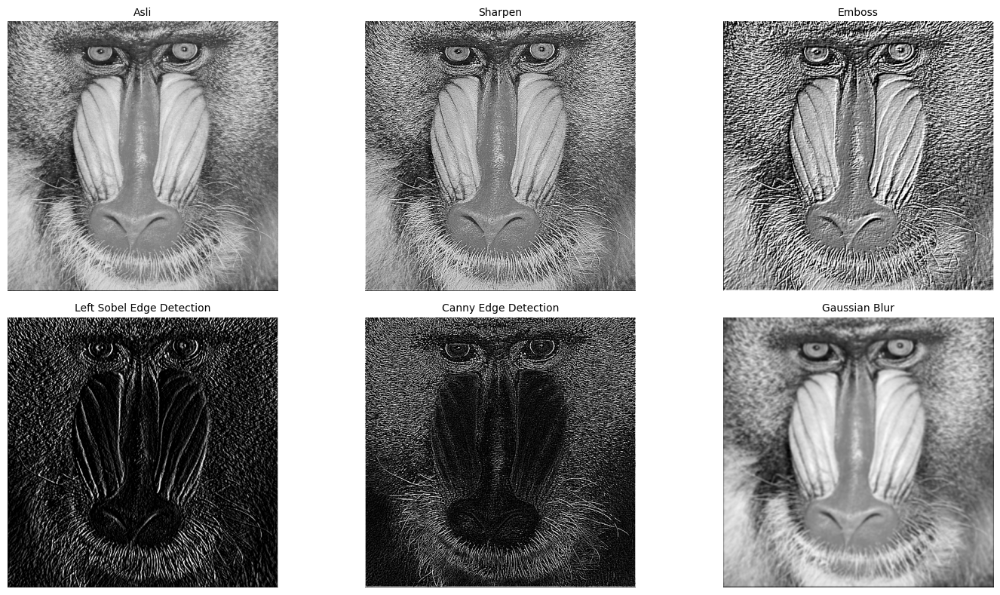

In [ ]:
import cv2 as cv
import numpy as np

def convolution2d(image, kernel, stride=1, padding=0):
    image = image.astype(np.float32)
    kernel = np.flipud(np.fliplr(kernel))

    if padding > 0:
        image_padded = np.pad(image, ((padding, padding), (padding, padding)), mode='constant')
    else:
        image_padded = image

    x_k, y_k = kernel.shape
    x_i, y_i = image_padded.shape

    out_x = int((x_i - x_k) / stride) + 1
    out_y = int((y_i - y_k) / stride) + 1

    output = np.zeros((out_x, out_y), dtype=np.float32)

    for y in range(0, out_y):
        for x in range(0, out_x):
            region = image_padded[y*stride:y*stride+x_k, x*stride:x*stride+y_k]
            output[y, x] = np.sum(region * kernel)

    output = np.clip(output, 0, 255)
    return output.astype(np.uint8)

img = cv.imread('/content/drive/MyDrive/PCVK/images/mandrill.tiff')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

kernel_emboss = np.array([[-2, -1, 0],
                          [-1, 1, 1],
                          [0, 1, 2]])

kernel_left_sobel = np.array([[-1, 0, 1],
                              [-2, 0, 2],
                              [-1, 0, 1]])

kernel_canny = np.array([[-1, -1, -1],
                         [-1, 8, -1],
                         [-1, -1, -1]])

kernel_size = 5
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.T

# Tampilkan hasil
from google.colab.patches import cv2_imshow
result_sharpen = convolution2d(img_gray, kernel_sharpen, stride=1, padding=1)
result_emboss = convolution2d(img_gray, kernel_emboss, stride=1, padding=1)
result_sobel = convolution2d(img_gray, kernel_left_sobel, stride=1, padding=1)
result_canny = convolution2d(img_gray, kernel_canny, stride=1, padding=1)
result_gauss = convolution2d(img_gray, gauss_kernel, stride=1, padding=2)

import cv2 as cv
import numpy as np
import math
from google.colab.patches import cv2_imshow

def convolution2d(image, kernel, stride=1, padding=0):
    image = image.astype(np.float32)
    kernel = np.flipud(np.fliplr(kernel))

    if padding > 0:
        image_padded = np.pad(image, ((padding, padding), (padding, padding)), mode='constant')
    else:
        image_padded = image

    x_k, y_k = kernel.shape
    x_i, y_i = image_padded.shape

    out_x = int((x_i - x_k) / stride) + 1
    out_y = int((y_i - y_k) / stride) + 1

    output = np.zeros((out_x, out_y), dtype=np.float32)

    for y in range(0, out_y):
        for x in range(0, out_x):
            region = image_padded[y*stride:y*stride+x_k, x*stride:x*stride+y_k]
            output[y, x] = np.sum(region * kernel)

    output = np.clip(output, 0, 255)
    return output.astype(np.uint8)

# Load citra
img = cv.imread('/content/drive/MyDrive/PCVK/images/mandrill.tiff')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Definisi kernel
kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

kernel_emboss = np.array([[-2, -1, 0],
                          [-1, 1, 1],
                          [0, 1, 2]])

kernel_left_sobel = np.array([[-1, 0, 1],
                              [-2, 0, 2],
                              [-1, 0, 1]])

kernel_canny = np.array([[-1, -1, -1],
                         [-1, 8, -1],
                         [-1, -1, -1]])

# Kernel Gaussian
kernel_size = 5
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.T

# Proses konvolusi
result_sharpen = convolution2d(img_gray, kernel_sharpen, stride=1, padding=1)
result_emboss = convolution2d(img_gray, kernel_emboss, stride=1, padding=1)
result_sobel = convolution2d(img_gray, kernel_left_sobel, stride=1, padding=1)
result_canny = convolution2d(img_gray, kernel_canny, stride=1, padding=1)
result_gauss = convolution2d(img_gray, gauss_kernel, stride=1, padding=2)

titles = ['Asli',
          'Sharpen',
          'Emboss',
          'Left Sobel Edge Detection',
          'Canny Edge Detection',
          'Gaussian Blur']

images = [img_gray, result_sharpen, result_emboss, result_sobel, result_canny, result_gauss]

plt.figure(figsize=(15, 8))
for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(images[i], cmap='gray')
    plt.title(titles[i], fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

FILTER LIBRARY DAN FILTER MODERN

Percobaan 1

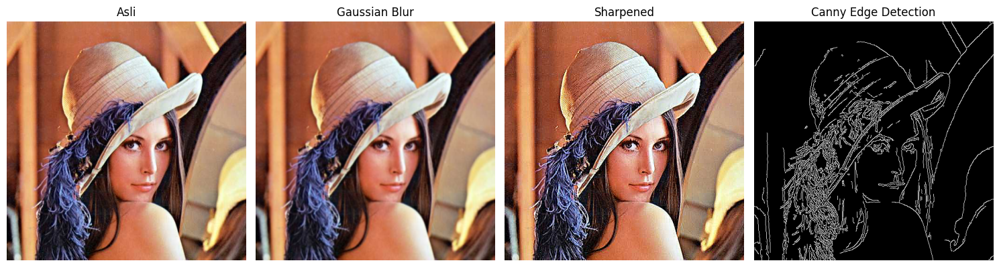

In [ ]:
def show_side_by_side(images, titles, figsize=(15, 5)):
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        if len(img.shape) == 2:
            plt.imshow(img, cmap="gray")
        else:
            plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

img = cv.imread("/content/drive/MyDrive/PCVK/images/lena.jpg")
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

blur = cv.GaussianBlur(img, (7, 7), 1)

edges = cv.Canny(img_gray, 100, 200)

sharpen_kernel = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])

sharpened = cv.filter2D(img, -1, sharpen_kernel)

show_side_by_side(
    [img, blur, sharpened, edges],
    ["Asli", "Gaussian Blur", "Sharpened", "Canny Edge Detection"])

Percobaan 2

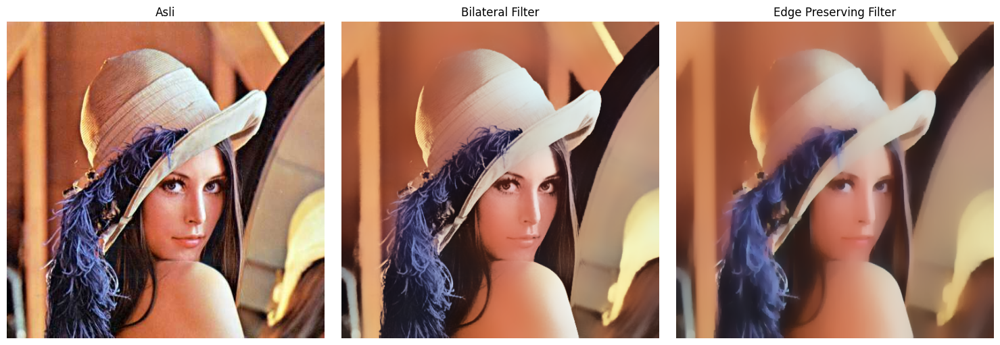

In [ ]:
bilateral = cv.bilateralFilter(img, 50, 100, 150)
edge_preserve = cv.edgePreservingFilter(img, flags=1, sigma_s=100, sigma_r=0.9)

show_side_by_side([img, bilateral, edge_preserve], ["Asli", "Bilateral Filter","Edge Preserving Filter"])


Percobaan 3

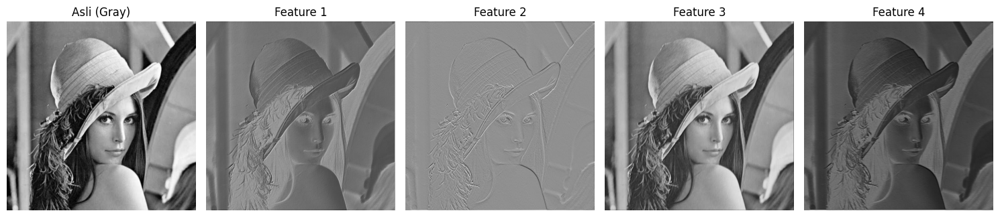

In [ ]:
import torch
import torch.nn as nn

class SimpleCNN(nn.Module):
  def __init__(self):
    super(SimpleCNN, self) .__init__()
    self.conv1 = nn.Conv2d(1, 4, kernel_size=3, stride=1, padding=1)
  def forward(self, x):
    return self.conv1(x)

model = SimpleCNN()

img_tensor = torch.tensor(img_gray, dtype=torch.float32).unsqueeze(0).unsqueeze(0) / 255.0

with torch.no_grad():
  features = model(img_tensor)

feature_maps = [features[0,i].numpy() for i in range(features.shape[1])]
show_side_by_side([img_gray] + feature_maps, ["Asli (Gray)"] + [f"Feature {i+1}" for i in range(len(feature_maps))])


Percobaan 4

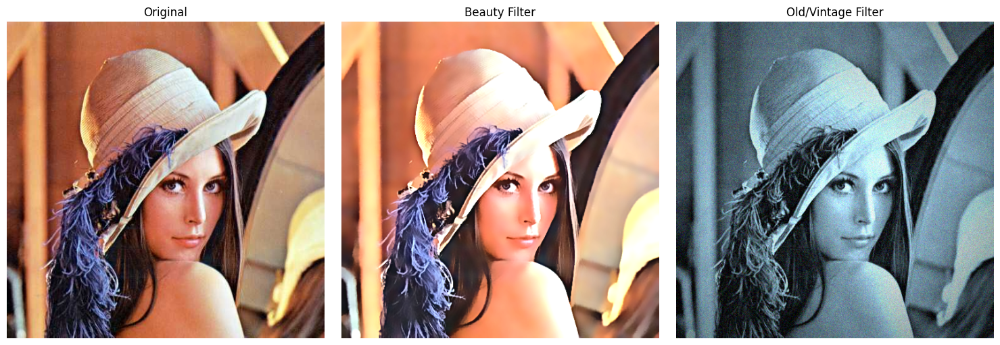

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/images/lena.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# ==========================
# 1. Beauty Filter
# ==========================

# Step 1: Smoothing kulit dengan bilateral filter
smooth = cv.bilateralFilter(img, d=15, sigmaColor=75, sigmaSpace=75)

# Step 2: Unsharp masking (pertajam mata/bibir)
gaussian = cv.GaussianBlur(smooth, (0,0), 3)
sharpened = cv.addWeighted(smooth, 1.5, gaussian, -0.5, 0)

# Step 3: Brightness & contrast
alpha = 1.2  # contrast
beta = 15    # brightness
beauty = cv.convertScaleAbs(sharpened, alpha=alpha, beta=beta)

# ========================== # 2. Old/Vintage Filter # ==========================
# Step 1: Sepia tone
sepia_kernel = np.array([[0.272, 0.534, 0.131],
                        [0.349, 0.686, 0.168],
                        [0.393, 0.769, 0.189]])
sepia = cv.transform(img, sepia_kernel)
sepia = np.clip(sepia, 0, 255).astype(np.uint8)

# Step 2: Vignette
rows, cols = img. shape [ : 2]
kernel_x = cv.getGaussianKernel(cols, cols*0.6)
kernel_y = cv.getGaussianKernel(rows, rows*0.6)
kernel = kernel_y * kernel_x.T
mask = kernel / kernel.max()
vignette = np.copy(sepia)
for i in range(3):
  vignette[:,:,i] = vignette[:,:,i] * mask

# Step 3: Noise/Grain
noise = np.random.normal(0, 15, vignette.shape).astype(np.int16)
old_img = np.clip(vignette.astype(np.int16) + noise, 0, 255).astype(np.uint8)


titles = ['Original',
          'Beauty Filter',
          'Old/Vintage Filter']
images = [img,
          beauty,
          old_img]

plt.figure(figsize=(15,5))
for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')
plt.tight_layout()
plt.show()

Percobaan 5

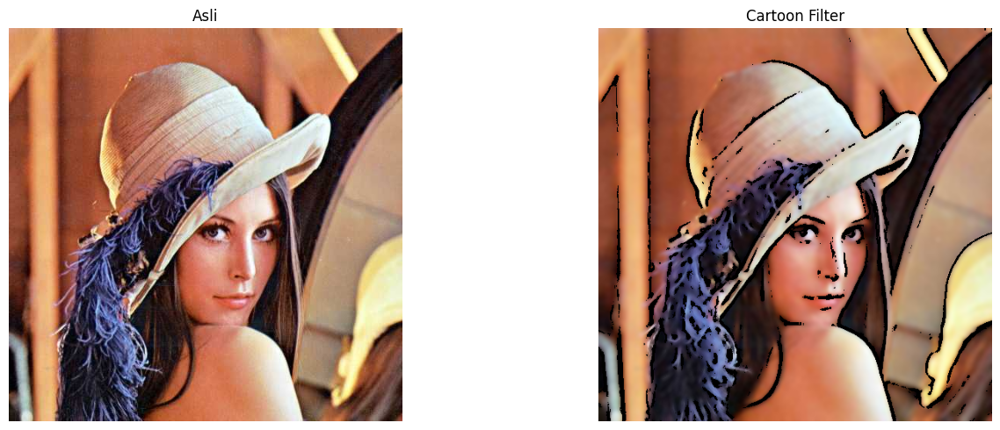

In [ ]:
#Filter Anime / Cartoon
# Step 1: Edge detection (pakai median blur dulu agar gambar menjadi Lebih halus)
img = cv.imread('/content/drive/MyDrive/PCVK/images/lena.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray_blur = cv.medianBlur(gray, 7)
edges = cv.adaptiveThreshold(gray_blur, 255,
                             cv.ADAPTIVE_THRESH_MEAN_C,
                             cv. THRESH_BINARY, 9, 9)

# Step 2: Bilateral filter untuk smoothing warna
color = cv.bilateralFilter(img, d=9, sigmaColor=200, sigmaSpace=200)
# Step 3: Gabungkan (cartoonize)
cartoon = cv.bitwise_and(color, color, mask=edges)

# Tampilkan
show_side_by_side([img, cartoon], ["Asli", "Cartoon Filter"])

Percobaan 6

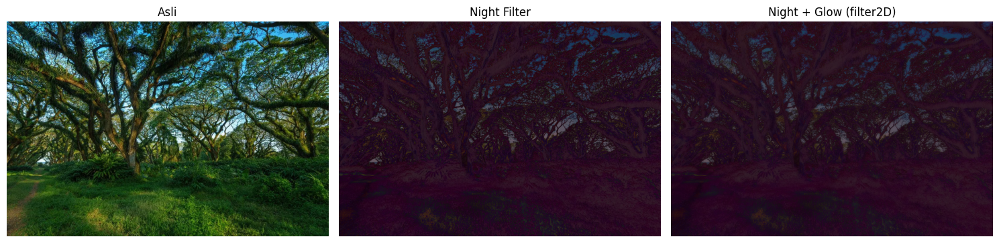

In [ ]:
#Night Filter
img = cv.imread('/content/drive/MyDrive/PCVK/images/djawatan.jpeg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Step 1: Gelapkan (contrast turun, brightness negatif)
night = cv.convertScaleAbs(img, alpha=0.6, beta =- 40)

# Step 2: Tambah bias biru
blue_tint = np.full_like(night, (50, 0, 100)) # BGR
night = cv.addWeighted(night, 0.8, blue_tint, 0.2, 0)

# Step 3: Efek glow di area terang dengan filter2D (blur kernel)
kernel = np.ones((15,15), np.float32) / 225
glow = cv.filter2D(night, -1, kernel)

# Kombinasikan asli + glow
night_glow= cv.addWeighted(night, 0.7, glow, 0.3,0)

show_side_by_side([img, night, night_glow],
                  ["Asli", "Night Filter", "Night + Glow (filter2D)"])

Percobaan 7

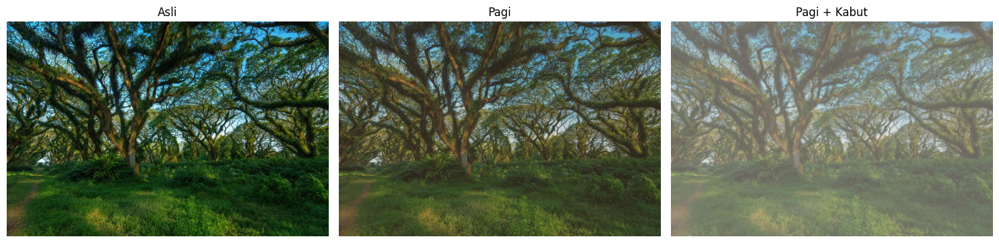

In [ ]:
#Filter Suasana pagi dan Kabut
# ============================
# Step 1: Kurangi kontras & cerahkan
# ============================
alpha = 0.9  # contrast
beta = 20    # brightness
soft = cv.convertScaleAbs(img, alpha=alpha, beta=beta)

# ============================
# Step 2: Tambahkan warm tone (kemerahan / oranye)
# ============================
warm_tint = np.full_like(soft, (40, 70, 120))  # BGR
pagi = cv.addWeighted(soft, 0.8, warm_tint, 0.2, 0)

# ============================
# Step 3: Tambahkan haze (kabut tipis) dengan filter2D
# ============================
# kernel blur Gaussian-like untuk menciptakan efek kabut
kernel = cv.getGaussianKernel(3, 3)
kernel = kernel @ kernel.T   # jadikan 2D kernel
kabut = cv.filter2D(pagi, -1, kernel)

# tambah layer putih untuk kabut lebih nyata
white_layer = np.full_like(pagi, 255)
kabut = cv.addWeighted(kabut, 0.7, white_layer, 0.3, 0)

show_side_by_side([img, pagi, kabut],
                  ["Asli", "Pagi", "Pagi + Kabut"])
